In [1]:
import bokeh
from bokeh.plotting import show
import numpy as np
import pandas as pd
import flowkit as fk
bokeh.io.output_notebook()

import os
import anndata as ad
import scanpy as sc
import joypy

Loading BokehJS ...

In [2]:
session = fk.Session(fcs_samples = 'data/clean/')
session

Session(16 samples)

In [5]:
biex_xform = fk.transforms.WSPBiexTransform(
    'biex',
    max_value = 65536,
    positive  = 3.71,
    width     = -100,
    negative  = 0
)

session.add_transform(biex_xform)

In [18]:
case = session.get_sample_ids()[0]
sample = session.get_sample(case)
sample.channels

,channel_number,pnn,pns,png,pne,pnr
0,1,PECy5-5,CD3e,1.0,"(0.0, 0.0)",11102.0
1,2,PECy7,CD16-32,1.0,"(0.0, 0.0)",43415.0
2,3,DL800,Ly6G,1.0,"(0.0, 0.0)",29696.0
3,4,AF700,CD45,1.0,"(0.0, 0.0)",17030.0
4,5,APCCy7,CD48,1.0,"(0.0, 0.0)",21726.0
5,6,BUV395,CD11b,1.0,"(0.0, 0.0)",75310.0
6,7,BUV737,B220,1.0,"(0.0, 0.0)",113076.0
7,8,BV605,Ly6C,1.0,"(0.0, 0.0)",123951.0


In [16]:
sample.apply_transform(biex_xform)

In [21]:
p = sample.plot_scatter(2, 8, source = 'xform', subsample = True)
show(p)

In [22]:
p = sample.plot_scatter_matrix()
show(p)

In [71]:
events = []

for sample in session.get_sample_ids():
    fcs = session.get_sample(sample)
    fcs.apply_transform(biex_xform)
    df = fcs.as_dataframe(source = 'xform')
    df.insert(0, 'sample_id', sample)
    events.append(df)

events = pd.concat(events)

events

pnn,sample_id,PECy5-5,PECy7,DL800,AF700,APCCy7,BUV395,BUV737,BV605
pns,,CD3e,CD16-32,Ly6G,CD45,CD48,CD11b,B220,Ly6C
0,Mock_01_A.fcs,1141.502801,1884.283173,631.694678,2096.491398,2345.868626,1541.958951,3431.587756,1197.512280
1,Mock_01_A.fcs,1146.759063,1001.825654,911.361470,1859.862764,1385.111571,1323.273261,3219.384459,1711.602316
2,Mock_01_A.fcs,1147.575687,2237.875240,844.361401,2068.902565,1974.999994,2711.006654,1238.627796,2597.616532
3,Mock_01_A.fcs,1329.867442,2329.289555,791.594765,1443.450031,2116.643027,3098.270045,1792.858119,2867.574559
4,Mock_01_A.fcs,1043.718253,2040.863053,342.438555,1501.455922,2602.254838,2053.469957,2690.738776,1301.960150
...,...,...,...,...,...,...,...,...,...
9995,Virus_08_B.fcs,1181.199411,2062.958410,1020.644695,2222.501781,3028.874306,1196.163146,1290.872505,2862.028376
9996,Virus_08_B.fcs,2095.758425,1151.508358,532.888355,3483.597602,2999.223932,1192.627465,1491.959433,1200.050262
9997,Virus_08_B.fcs,988.570976,2782.743105,3420.605518,2340.588188,844.357929,3230.763408,1192.251332,2647.649146


In [24]:
events.shape

(160000, 9)

Remove `sample_id` column and convert to NumPy array using the `values` attribute.

In [72]:
data = events.iloc[:, 1:].values
data

array([[1141.50280132, 1884.2831733 ,  631.69467765, ..., 1541.95895065,
        3431.58775581, 1197.51228017],
       [1146.75906307, 1001.82565389,  911.3614702 , ..., 1323.27326057,
        3219.38445906, 1711.60231567],
       [1147.57568718, 2237.87523964,  844.36140104, ..., 2711.00665421,
        1238.62779576, 2597.61653185],
       ...,
       [ 988.57097594, 2782.74310511, 3420.60551835, ..., 3230.76340844,
        1192.25133231, 2647.64914619],
       [1058.48255246, 2461.78762895, 2161.28897515, ..., 3265.11245969,
        1346.95101511, 1779.01250276],
       [1557.11573387, 2177.3308427 , 1287.66210585, ..., 3546.71218449,
        1642.92252356, 3246.93590411]])

In [73]:
adata = ad.AnnData(data)
adata

AnnData object with n_obs × n_vars = 160000 × 8

In [27]:
adata.X

array([[   51.64030075,  1239.35998535,  -681.25701904, ...,
          627.25897217, 17763.59960938,   128.93400574],
       [   58.88240051,  -140.92100525,  -267.03900146, ...,
          304.61499023, 11834.79980469,   907.36499023],
       [   60.00770187,  2191.26000977,  -362.0880127 , ...,
         4740.70996094,   185.94700623,  3915.82006836],
       ...,
       [ -159.28700256,  5363.39013672, 17389.30078125, ...,
        12091.59960938,   121.65899658,  4257.97998047],
       [  -62.68360138,  3132.70996094,  1941.66003418, ...,
        12904.        ,   338.24398804,  1030.07995605],
       [  650.94396973,  1991.48999023,   254.42900085, ...,
        22242.30078125,   789.63897705, 12467.        ]])

In [74]:
adata.obs_names = np.arange(adata.shape[0]).astype('str')
adata.obs_names

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9',
       ...
       '159990', '159991', '159992', '159993', '159994', '159995', '159996',
       '159997', '159998', '159999'],
      dtype='object', length=160000)

In [75]:
adata.var_names = events.droplevel(0, axis = 1).columns[1:]
adata.var_names

Index(['CD3e', 'CD16-32', 'Ly6G', 'CD45', 'CD48', 'CD11b', 'B220', 'Ly6C'], dtype='object', name='pns')

In [76]:
adata.obs['sample_id'] = pd.Categorical(events.sample_id)
adata.obs

,sample_id
0,Mock_01_A.fcs
1,Mock_01_A.fcs
2,Mock_01_A.fcs
3,Mock_01_A.fcs
4,Mock_01_A.fcs
...,...
159995,Virus_08_B.fcs
159996,Virus_08_B.fcs
159997,Virus_08_B.fcs
159998,Virus_08_B.fcs


In [77]:
adata

AnnData object with n_obs × n_vars = 160000 × 8
    obs: 'sample_id'

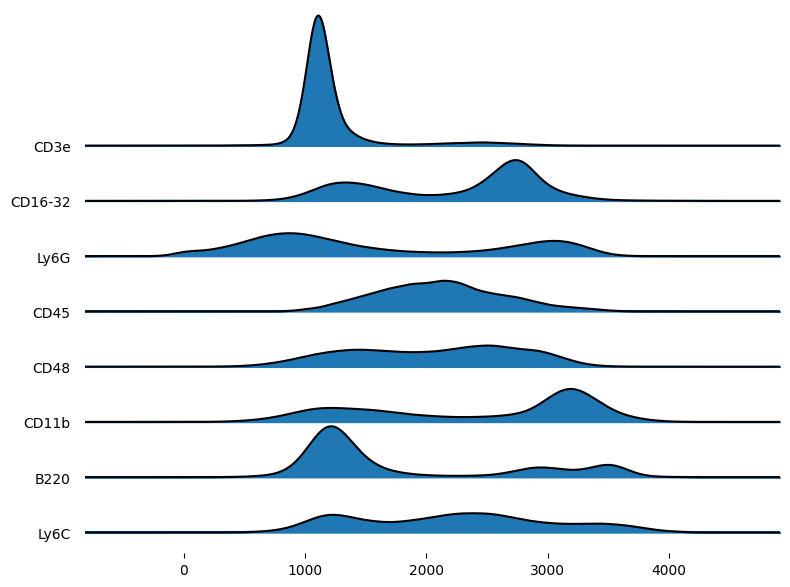

In [87]:
p = joypy.joyplot(
    adata.to_df().sample(10000),
    figsize = (8, 6),
    column  = adata.var_names.to_list(),
    overlap = 1.5
)